# Hotel Booking

In [99]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
import statsmodels.api as sm
import numpy as np
import datetime
import plotly as px
import plotly.express as px
import plotly.graph_objs as go
%matplotlib inline

from matplotlib import pyplot as plt
from scipy import stats
from statsmodels.tsa.stattools import adfuller 
from pmdarima import auto_arima
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_absolute_percentage_error

In [3]:
data = pd.read_csv("hotel_bookings.csv")
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [5]:
Nan = data.isna().sum()
Nan

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [6]:
#Data Cleaning 

In [7]:
data = data.drop(['company','agent'], axis = 1)
data = data.dropna(subset = ['country','children','arrival_date_week_number'], axis = 0)
data = data.reset_index(drop = True)
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118898 entries, 0 to 118897
Data columns (total 30 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           118898 non-null  object 
 1   is_canceled                     118898 non-null  int64  
 2   lead_time                       118898 non-null  int64  
 3   arrival_date_year               118898 non-null  int64  
 4   arrival_date_month              118898 non-null  object 
 5   arrival_date_week_number        118898 non-null  int64  
 6   arrival_date_day_of_month       118898 non-null  int64  
 7   stays_in_weekend_nights         118898 non-null  int64  
 8   stays_in_week_nights            118898 non-null  int64  
 9   adults                          118898 non-null  int64  
 10  children                        118898 non-null  float64
 11  babies                          118898 non-null  int64  
 12  meal            

In [9]:
data['children'].sort_values()

0          0.0
77591      0.0
77590      0.0
77589      0.0
77588      0.0
          ... 
40460      3.0
54244      3.0
118578     3.0
117041     3.0
327       10.0
Name: children, Length: 118898, dtype: float64

In [10]:
data['children'] = data['children'].astype(int)
data['children'].dtype

dtype('int64')

In [12]:
#convert string month to numerical month Dec->12
datetime_object = data['arrival_date_month'].str[0:3]
month_number = np.zeros(len(datetime_object))

#create a new column based on numerical representation of the months 
for i in range(0, len(datetime_object)):
    datetime_object[i] = datetime.datetime.strptime(datetime_object[i], "%b") 
    month_number[i] = datetime_object[i].month
    
#float to integer 
month_number = pd.DataFrame(month_number).astype(int)

In [13]:
data['arrival_date'] = data['arrival_date_year'].map(str) + '-' + month_number[0].map(str) + '-' + data['arrival_date_day_of_month'].map(str)

In [14]:
data = data.drop(['arrival_date_year','arrival_date_month','arrival_date_day_of_month','arrival_date_week_number'], axis = 1)

In [15]:
data.head()

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,...,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date
0,Resort Hotel,0,342,0,0,2,0,0,BB,PRT,...,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-7-1
1,Resort Hotel,0,737,0,0,2,0,0,BB,PRT,...,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-7-1
2,Resort Hotel,0,7,0,1,1,0,0,BB,GBR,...,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-7-1
3,Resort Hotel,0,13,0,1,1,0,0,BB,GBR,...,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-7-1
4,Resort Hotel,0,14,0,2,2,0,0,BB,GBR,...,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-7-1


In [16]:
data['arrival_date'].dtype

dtype('O')

In [17]:
#convert wrong datatype to correct type: object -> datetime 
data['arrival_date'] = pd.to_datetime(data['arrival_date'])
data['reservation_status_date'] = pd.to_datetime(data['reservation_status_date'])

print('Datetype of the arrival_date is: ', data['arrival_date'].dtype)
print('Datetype of the reservation_status_date is: ', data['reservation_status_date'].dtype)

Datetype of the arrival_date is:  datetime64[ns]
Datetype of the reservation_status_date is:  datetime64[ns]


In [18]:
#some data points include zero total guests, drop them 
data['Total Guests'] = data['adults'] + data['children']
data = data[data['Total Guests'] != 0]
data.head(3)

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,...,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,Total Guests
0,Resort Hotel,0,342,0,0,2,0,0,BB,PRT,...,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,2
1,Resort Hotel,0,737,0,0,2,0,0,BB,PRT,...,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,2
2,Resort Hotel,0,7,0,1,1,0,0,BB,GBR,...,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,1


In [19]:
#create new features 
#calculate total guests for each record 
data['Total Guests'] = data['Total Guests'].astype(int)
data['Total Guests'].head()

0    2
1    2
2    1
3    1
4    2
Name: Total Guests, dtype: int64

In [20]:
#total number of days stayed 
data['Total Stays'] = data['stays_in_week_nights'] + data['stays_in_weekend_nights']

dataNoCancel = data[data['is_canceled'] == 0]
dataNoCancel = dataNoCancel.reset_index(drop = True)

In [21]:
data.head(3)

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,...,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,Total Guests,Total Stays
0,Resort Hotel,0,342,0,0,2,0,0,BB,PRT,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,2,0
1,Resort Hotel,0,737,0,0,2,0,0,BB,PRT,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,2,0
2,Resort Hotel,0,7,0,1,1,0,0,BB,GBR,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,1,1


In [22]:
data['hotel'].value_counts()

City Hotel      79143
Resort Hotel    39585
Name: hotel, dtype: int64

In [23]:
#create two dataframes include only discrete hotel type 
dataResort = data[data['hotel'] == 'Resort Hotel']
dataCity = data[data['hotel'] == 'City Hotel']

data = data.reset_index(drop = True)
data.head()

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,...,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,Total Guests,Total Stays
0,Resort Hotel,0,342,0,0,2,0,0,BB,PRT,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,2,0
1,Resort Hotel,0,737,0,0,2,0,0,BB,PRT,...,0,Transient,0.0,0,0,Check-Out,2015-07-01,2015-07-01,2,0
2,Resort Hotel,0,7,0,1,1,0,0,BB,GBR,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,1,1
3,Resort Hotel,0,13,0,1,1,0,0,BB,GBR,...,0,Transient,75.0,0,0,Check-Out,2015-07-02,2015-07-01,1,1
4,Resort Hotel,0,14,0,2,2,0,0,BB,GBR,...,0,Transient,98.0,0,1,Check-Out,2015-07-03,2015-07-01,2,2


In [24]:
#Calculate Number of guests per week - Resort 
Number_guests_resort= dataResort[['arrival_date','Total Guests']]
Number_guests_resort_weekly = dataResort['Total Guests'].groupby(dataResort['arrival_date']).sum()

Number_guests_resort_weekly = Number_guests_resort_weekly.resample('w').sum().to_frame()
Number_guests_resort_weekly.head()

,Total Guests
arrival_date,
2015-07-05,464
2015-07-12,597
2015-07-19,723
2015-07-26,698
2015-08-02,769


In [25]:
#city hotel 
Number_guests_city= dataCity[['arrival_date','Total Guests']]
Number_guests_city_weekly = dataCity['Total Guests'].groupby(dataCity['arrival_date']).sum()

Number_guests_city_weekly = Number_guests_city_weekly.resample('w').sum().to_frame()
Number_guests_city_weekly.head()

,Total Guests
arrival_date,
2015-07-05,354
2015-07-12,440
2015-07-19,646
2015-07-26,876
2015-08-02,445


In [27]:
#Number of records by countries 
country_freq = data['country'].value_counts().to_frame()
country_freq.columns = ['count']

fig = px.choropleth(country_freq, color = 'count',
                   locations = country_freq.index, 
                   hover_name = country_freq.index,
                   color_continuous_scale = px.colors.sequential.Teal)
fig.update_traces(marker = dict(line = dict(color = '#000000', width = 1)))
fig.update_layout(title_text = 'Number of Records by Countries',
                 title_x = 0.5, title_font = dict(size = 22))

fig.show()

In [29]:
#number of records monthly 
dataResortMonthly = dataResort['arrival_date'].value_counts()
dataResortMonthly = dataResortMonthly.resample('m').sum().to_frame()

dataCityMonthly = dataCity['arrival_date'].value_counts()
dataCityMonthly = dataCityMonthly.resample('m').sum().to_frame()

fig = go.Figure()
fig.add_trace(go.Scatter(x = dataResortMonthly.index, y = dataResortMonthly['arrival_date'], name = 'Resort Hotel', 
                        hovertext = dataResortMonthly['arrival_date']))

fig.add_trace(go.Scatter(x = dataCityMonthly.index, y = dataCityMonthly['arrival_date'], name = 'City Hotel', 
                        hovertext = dataCityMonthly['arrival_date']))

fig.update_layout(title_text = 'Number of Records Monthly',
                  title_x = 0.5, title_font = dict(size = 30))

fig.update_layout(xaxis_title = 'Arrival Date',
                 yaxis_title = 'Number of Records')
fig.show()

In [30]:
#number of records weekly - resort 
dataResortWeekly = dataResort['arrival_date'].value_counts()
dataResortWeekly = dataResortWeekly.resample('w').sum().to_frame()


fig = go.Figure()
fig.add_trace(go.Scatter(x = dataResortWeekly.index, y = dataResortWeekly['arrival_date'], name = 'Resort Hotel', 
                        hovertext = dataResortWeekly['arrival_date']))

fig.update_layout(title_text = 'Number of Records Weekly',
                  title_x = 0.5, title_font = dict(size = 30))

fig.update_layout(xaxis_title = 'Arrival Date',
                 yaxis_title = 'Number of Records')
fig.show()

#City

dataCityWeekly = dataCity['arrival_date'].value_counts()
dataCityWeekly = dataCityWeekly.resample('w').sum().to_frame()


fig = go.Figure()
fig.add_trace(go.Scatter(x = dataCityWeekly.index, y = dataCityWeekly['arrival_date'], name = 'City Hotel', 
                        hovertext = dataCityWeekly['arrival_date']))

fig.update_layout(title_text = 'Number of Records Weekly',
                  title_x = 0.5, title_font = dict(size = 30))

fig.update_layout(xaxis_title = 'Arrival Date',
                 yaxis_title = 'Number of Records')
fig.show()

In [31]:
#number of guests weekly 
fig = go.Figure()

fig.add_trace(go.Scatter(x = Number_guests_resort_weekly.index, y =Number_guests_resort_weekly['Total Guests'],
                        name = "Resort Hotel", 
                        hovertext = Number_guests_resort_weekly['Total Guests']))
fig.add_trace(go.Scatter(x = Number_guests_city_weekly.index, y =Number_guests_city_weekly['Total Guests'],
                        name = "City Hotel", 
                        hovertext = Number_guests_city_weekly['Total Guests']))

fig.update_layout(title_text = 'Number of Guests Weekly',
                 title_x = 0.5, title_font = dict(size = 30))
fig.update_layout(xaxis_title = 'Arrival Date',
                 yaxis_title = 'Total Guests')

fig.show()

In [32]:
#number of guests by customer type 
customerTransient = data[data['customer_type'] == 'Transient']
customerContract = data[data['customer_type'] == 'Contract']
customerTransientParty = data[data['customer_type'] == 'Transient-Party']
customerGroup = data[data['customer_type'] == 'Group']

customerTransient = customerTransient.set_index('arrival_date')
customerContract = customerContract.set_index("arrival_date")
customerTransientParty = customerTransientParty.set_index("arrival_date")
customerGroup = customerGroup.set_index("arrival_date")

customerTransientMonthly = customerTransient.resample('m').sum()
customerContract = customerContract.resample('m').sum()
customerTransientParty = customerTransientParty.resample('m').sum()
customerGroup = customerGroup.resample('m').sum()

fig = go.Figure()
fig.add_trace(go.Scatter(x = customerTransientMonthly.index, 
                         y = customerTransientMonthly['Total Guests'],
                        name = "Transient Guests"))

fig.add_trace(go.Scatter(x = customerContract.index, 
                         y = customerContract['Total Guests'],
                        name = "Contract Guests"))

fig.add_trace(go.Scatter(x = customerTransientParty.index, 
                         y = customerTransientParty['Total Guests'],
                        name = "TransientParty Guests"))

fig.add_trace(go.Scatter(x = customerGroup.index, 
                         y = customerGroup['Total Guests'],
                        name = "Group Guests"))
fig.update_layout(title_text = "Number of Guests by Customer Type",
                 title_x = 0.45, title_font=dict(size= 30))
fig.update_layout(xaxis_title = 'Arrival Date',
                 yaxis_title = 'Number of Guests')

fig.show()

In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118728 entries, 0 to 118727
Data columns (total 29 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           118728 non-null  object        
 1   is_canceled                     118728 non-null  int64         
 2   lead_time                       118728 non-null  int64         
 3   stays_in_weekend_nights         118728 non-null  int64         
 4   stays_in_week_nights            118728 non-null  int64         
 5   adults                          118728 non-null  int64         
 6   children                        118728 non-null  int64         
 7   babies                          118728 non-null  int64         
 8   meal                            118728 non-null  object        
 9   country                         118728 non-null  object        
 10  market_segment                  118728 non-null  object 

In [34]:
data['market_segment'].value_counts()

Online TA        56333
Offline TA/TO    24125
Groups           19786
Direct           12424
Corporate         5099
Complementary      726
Aviation           235
Name: market_segment, dtype: int64

In [35]:
#number of guests by market segment - top three
marketOnline = data[data['market_segment'] == 'Online TA']
marketOffline = data[data['market_segment'] == 'Offline TA/TO']
marketGroups = data[data['market_segment'] == 'Groups']

marketOnline = marketOnline.set_index('arrival_date')
marketOffline = marketOffline.set_index('arrival_date')
marketGroups = marketGroups.set_index('arrival_date')

marketOnlineMonthly = marketOnline.resample('m').sum()
marketOffline = marketOffline.resample('m').sum()
marketGroups = marketGroups.resample('m').sum()

fig = go.Figure()

fig.add_trace(go.Scatter(x = marketOnlineMonthly.index,
                        y = marketOnlineMonthly['Total Guests'],
                        name = "Online Guests"))

fig.add_trace(go.Scatter(x = marketOffline.index,
                        y = marketOffline['Total Guests'],
                        name = "Offline Guests"))

fig.add_trace(go.Scatter(x = marketGroups.index,
                        y = marketGroups['Total Guests'],
                        name = "Group Guests"))

fig.update_layout(title_text = "Number of Guests by Top Three Market Segment",
                 title_x = 0.5, title_font = dict(size = 30),
                 xaxis_title = "Arrival Date",
                 yaxis_title = "Number of Guests")

fig.show()



In [36]:
#distribution of market segment by different hotel type 
fig = px.histogram(data, x="market_segment", color='hotel') #表示按hotel区分颜色
fig.update_layout(barmode = 'group', xaxis = {'categoryorder': 'total descending'})
fig.update_traces(marker = dict(line = dict(color = '#000000', width = 1)))
fig.update_layout(title_text = 'Distribution of Market Segment by different Hotel Types',
                 title_x = 0.5, title_font = dict(size = 30))

fig.show()

In [37]:
#distribution of reservation status 
reservation_status = data['reservation_status'].value_counts()
fig = go.Figure(go.Pie(labels = reservation_status.index, 
                      values = reservation_status,
                      opacity= 0.9))

fig.update_layout(title_text = 'Distribution of the Reservation Status',
                 title_x = 0.5, title_font= dict(size = 30))
fig.update_traces(textinfo = 'label,percent', marker = dict(line = dict(color = '#FFFFFF',width = 1)))

fig.show()

In [38]:
#distribution of room type and adr 
fig = px.box(data_frame = dataNoCancel, x = "reserved_room_type", y = "adr", color = 'hotel') #这里的x和y是具体的key，不是命名
fig.update_layout(title_text = "Distribution of Room Type and adr",
                 title_x = 0.5, title_font = dict(size = 30),
                 xaxis_title = 'Reserved Room Type')
fig.update_traces(marker= dict(line = dict(color = '#FFFFFF', width = 1)))
fig.show()

In [39]:
fig = px.box(data_frame = dataNoCancel, x = 'meal', y = 'adr', color = 'hotel')

fig.update_layout(title_text = "Distribution of Meal by ADR",
                 title_x = 0.5, title_font = dict(size = 30),
                 xaxis_title = "Meal")
fig.update_traces(marker = dict(line = dict(color = '#FFFFFF', width = 2)))
fig.show()

In [40]:
data['adr']

0           0.00
1           0.00
2          75.00
3          75.00
4          98.00
           ...  
118723     96.14
118724    225.43
118725    157.71
118726    104.40
118727    151.20
Name: adr, Length: 118728, dtype: float64

In [41]:
#did guests get the reserved room 
dataResort['TookReservedRoom'] = np.where(dataResort['reserved_room_type'] == dataResort['assigned_room_type'],
                                          'Yes', 'No') 
dataCity['TookReservedRoom'] = np.where(dataCity['reserved_room_type'] == dataCity['assigned_room_type'],
                                          'Yes', 'No') 


#np.where(condition, x, y)满足条件(condition)，输出x，不满足输出y

fig = go.Figure(go.Pie(labels=dataResort['TookReservedRoom'].unique(),
                            values=dataResort['TookReservedRoom'].value_counts(), opacity=0.9))

fig.update_traces(textinfo='percent+label', marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Did the Guests get the Reserved Room? - Resort Hotel',
                  title_x=0.5, title_font=dict(size=22))
fig.show()

fig = go.Figure(go.Pie(labels=dataCity['TookReservedRoom'].unique(),
                            values=dataCity['TookReservedRoom'].value_counts(), opacity=0.9))

fig.update_traces(textinfo='percent+label', marker=dict(line=dict(color='#FFFFFF', width=2)))
fig.update_layout(title_text='Did the Guests get the Reserved Room? - Resort Hotel',
                  title_x=0.5, title_font=dict(size=22))
fig.show()

/Users/nanyang/opt/anaconda3/envs/playground/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/nanyang/opt/anaconda3/envs/playground/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Density Plot of Number of Days Stayed for different Hotel Types')

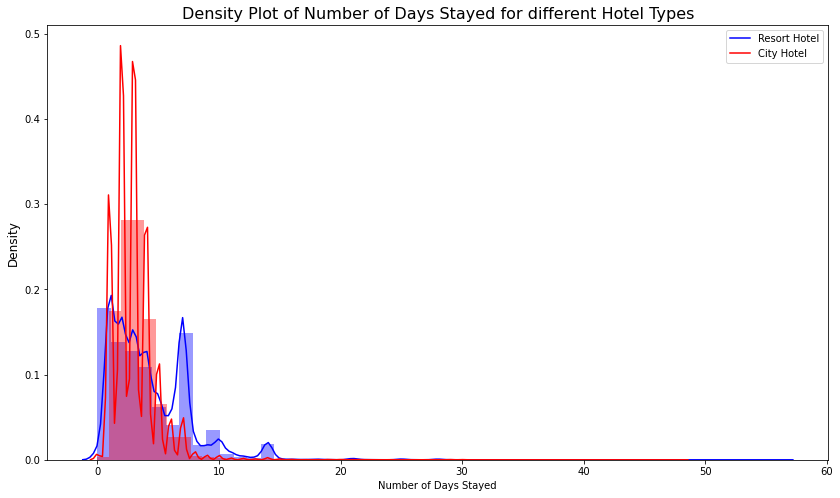

In [43]:
#density plot of number of days stayed for different hotel types 
plt.figure(figsize = (14,8))
sns.distplot(dataResort['Total Stays'], color = 'blue')
sns.distplot(dataCity['Total Stays'], color = 'red')
plt.xlabel('Number of Days Stayed')
plt.ylabel('Density', fontsize = 12)
plt.legend(['Resort Hotel','City Hotel'], loc = 'upper right')
plt.title('Density Plot of Number of Days Stayed for different Hotel Types', fontsize = 16)

Text(0.5, 1.0, 'Correction Graph of the City Hotel')

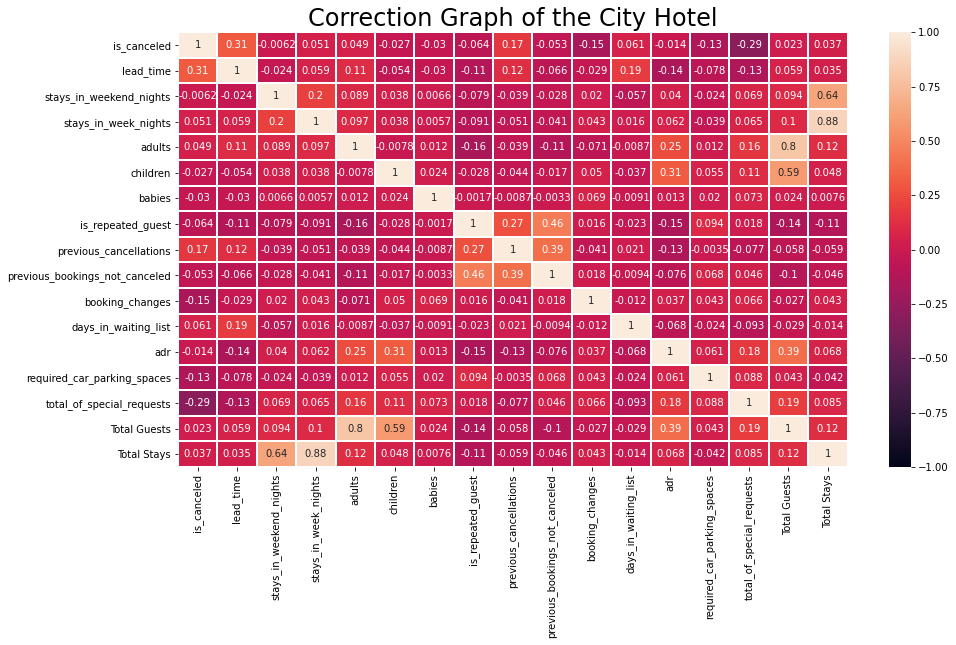

In [44]:
#collection graph city hotel 
plt.figure(figsize = (15,8))
correlation = sns.heatmap(dataCity.corr(), vmin = -1, vmax = 1, linewidths = 1, linecolor = 'white', annot = True) 
#annot是annotate缩写，图每个格里面的注释
correlation.set_title('Correction Graph of the City Hotel', fontdict = {'fontsize': 24})

Text(0.5, 1.0, 'Correlation Graph of the Resort Hotel')

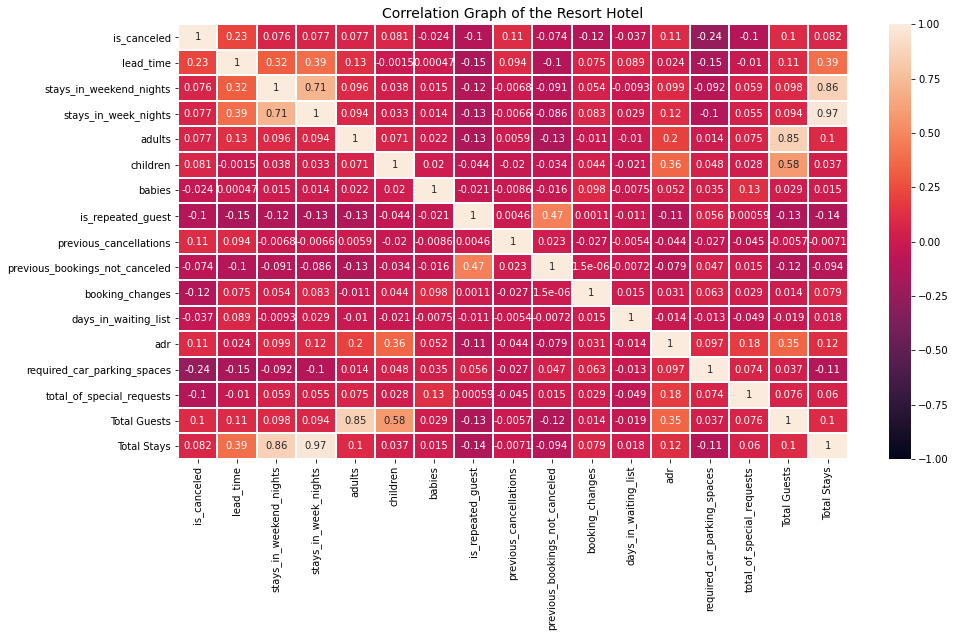

In [45]:
#collection graph resort hotel 

plt.figure(figsize = (15,8))
correlation = sns.heatmap(dataResort.corr(), vmin = -1, vmax = 1, annot = True, linewidths = 1, linecolor = 'white')

correlation.set_title('Correlation Graph of the Resort Hotel', fontdict = {'fontsize':14})

In [46]:
#ARIMA Model for Predicting Future Number of Guests (CITY HOTEL)
#时间序列是平稳的，所以一般在研究一段时间序列的时候，第一步都需要进行平稳性检验，除了用肉眼检测的方法，另外比较常用的严格的统计检验方法就是ADF检验，也叫做单位根检验。
#ADF所得出之统计值必为负数，负越多越倾向于拒绝零假设; 
#1%、%5、%10不同程度拒绝原假设的统计值和 ADF 假设检验值比较，ADF 假设检验值同时小于1%、5%、10%即说明非常好地拒绝该假设


## Dickey-Fuller Test to City Hotel Data
CityWeeklyValues = Number_guests_city_weekly.values
result_city = adfuller(CityWeeklyValues)
result_city



(-2.3997128800748038,
 0.14181746256345917,
 2,
 111,
 {'1%': -3.490683082754047,
  '5%': -2.8879516565798817,
  '10%': -2.5808574442009578},
 1399.101217489204)

In [47]:
print('ADF: %f' %result_city[0])
print('p_value: %f' % result_city[1])
print('Critical Value: ')
for key, value in result_city[4].items():
    print('%s: %.3f' %(key, value))

ADF: -2.399713
p_value: 0.141817
Critical Value: 
1%: -3.491
5%: -2.888
10%: -2.581


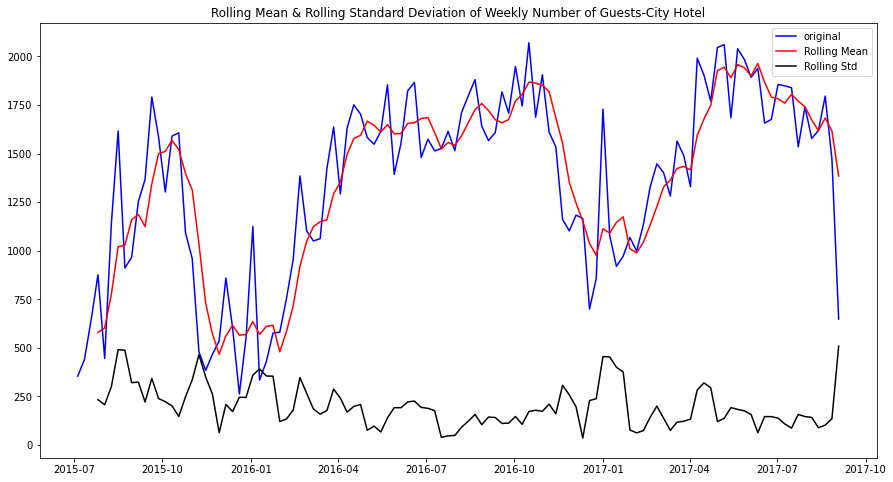

In [48]:
# Rolling Mean & Rolling Standard Deviation of City Hotel
plt.figure(figsize = (15,8))
rolling_mean = Number_guests_city_weekly.rolling(window = 4).mean()
rolling_std = Number_guests_city_weekly.rolling(window = 4).std()
plt.plot(Number_guests_city_weekly, color = 'blue', label = 'original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'upper right')
plt.title('Rolling Mean & Rolling Standard Deviation of Weekly Number of Guests-City Hotel')
plt.show()

In [49]:
Number_guests_city_weekly.info

<bound method DataFrame.info of               Total Guests
arrival_date              
2015-07-05             354
2015-07-12             440
2015-07-19             646
2015-07-26             876
2015-08-02             445
...                    ...
2017-08-06            1578
2017-08-13            1619
2017-08-20            1796
2017-08-27            1473
2017-09-03             648

[114 rows x 1 columns]>

In [58]:
trainCity = Number_guests_city_weekly[:90]
testCity = Number_guests_city_weekly[90:]

In [59]:

# Fit auto_arima function to NumberOfGuests_CityWeekly Dataset
stepwise_fit = auto_arima(traincity['Total Guests'], start_p=1, start_q=1,
                          max_p=3, max_q=3, m=12,
                          start_P=0, seasonal=True,
                          d=None, D=1, trace=True,
                          error_action='ignore',
                          suppress_warnings=True,
                          stepwise=True)

stepwise_fit.summary()


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1232.594, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1133.872, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1230.900, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1145.491, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1132.194, Time=0.50 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1214.079, Time=0.42 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1131.441, Time=0.80 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1133.469, Time=0.27 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1130.6

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   90
Model:             SARIMAX(3, 0, 0)x(2, 1, 0, 12)   Log Likelihood                -558.442
Date:                            Tue, 20 Jul 2021   AIC                           1128.884
Time:                                    11:25:59   BIC                           1143.024
Sample:                                         0   HQIC                          1134.544
                                             - 90                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6147      0.120      5.131      0.000       0.380       0.850
ar.L2          0.0667      0.166      0.402      0.687      -0.258       0.391
ar.L3          0.2076      0.133      1.564      0.118      -0.052       0.468
ar.S.L12      -0.6925      0.171     -4.054      0.000      -1.027      -0.358
ar.S.L24      -0.3475      0.142     -2.450      0.014      -0.626      -0.070
sigma2      9.184e+04   1.71e+04      5.384      0.000    5.84e+04    1.25e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                 1.59
Prob(Q):                              0.77   Prob(JB):                         0.45
Heteroskedasticity (H):               0.68   Skew:                            -0.31
Prob(H) (two-sided):                  0.33   Kurtosis:                         3.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [74]:
modelCity = sm.tsa.statespace.SARIMAX(trainCity['Total Guests'],
                  order=(3, 0, 0), seasonal_order = (2,1,0,12))

resultCity = modelCity.fit()

# Prediction of the Test data
predictionsCityTest = resultCity.predict(90, 113, typ='levels').rename("Predictions")

Text(0, 0.5, 'Number of Guests')

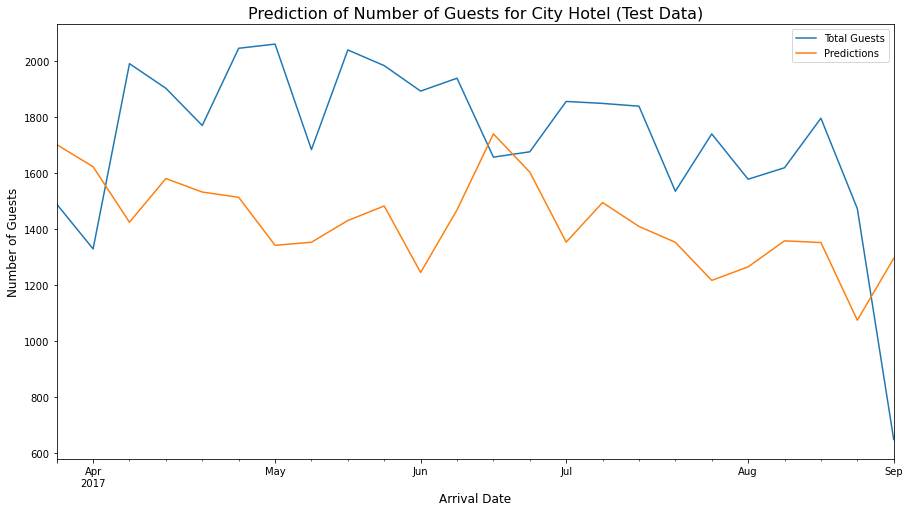

In [75]:
plt.figure(figsize=(15, 8))
testCity['Total Guests'].plot(legend=True)
predictionsCityTest.plot(legend=True)
plt.title('Prediction of Number of Guests for City Hotel (Test Data)', fontsize=16)
plt.xlabel('Arrival Date', fontsize=12)
plt.ylabel('Number of Guests', fontsize=12)

Text(0, 0.5, 'Number of Guests')

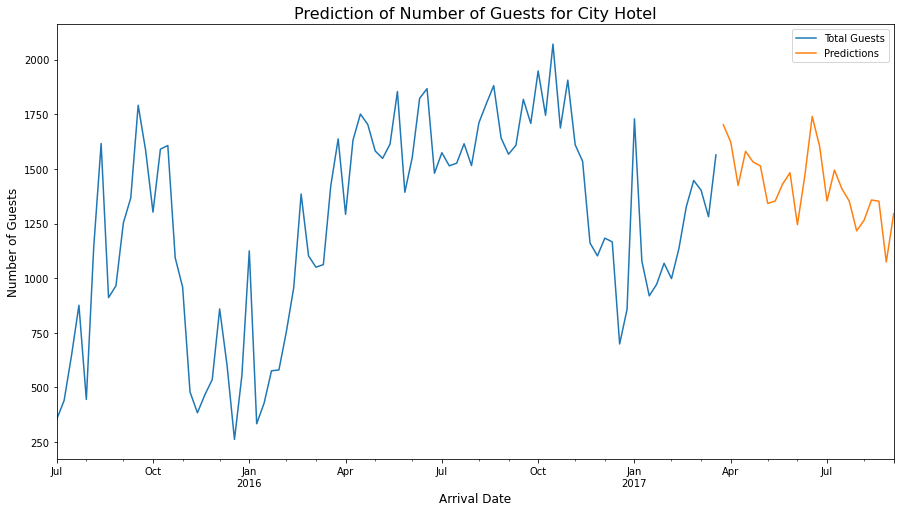

In [76]:
#Prediction of Number of Guests
plt.figure(figsize=(15, 8))
trainCity['Total Guests'].plot(legend=True)
predictionsCityTest.plot(legend=True)
plt.title('Prediction of Number of Guests for City Hotel', fontsize=16)
plt.xlabel('Arrival Date', fontsize=12)
plt.ylabel('Number of Guests', fontsize=12)

In [92]:
MeanAbsPercentageErrCity_test = mean_absolute_percentage_error(testCity, predictionsCityTest)
print('Test MAPE City Hotel: %f' % MeanAbsPercentageErrCity_test)

Test MAPE City Hotel: 0.249210


In [79]:
#ARIMA Model for Predicting Future Number of Guests (RESORT HOTEL)
# Dickey-Fuller Test to City Resort Data
ResortWeeklyValues = Number_guests_resort_weekly.values
result_resort = adfuller(ResortWeeklyValues)
print('ADF Statistic: %f' % result_resort[0])
print('p-value: %f' % result_resort[1])
print('Critical Values:')
for key, value in result_resort[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.121934
p-value: 0.000891
Critical Values:
	1%: -3.490
	5%: -2.888
	10%: -2.581


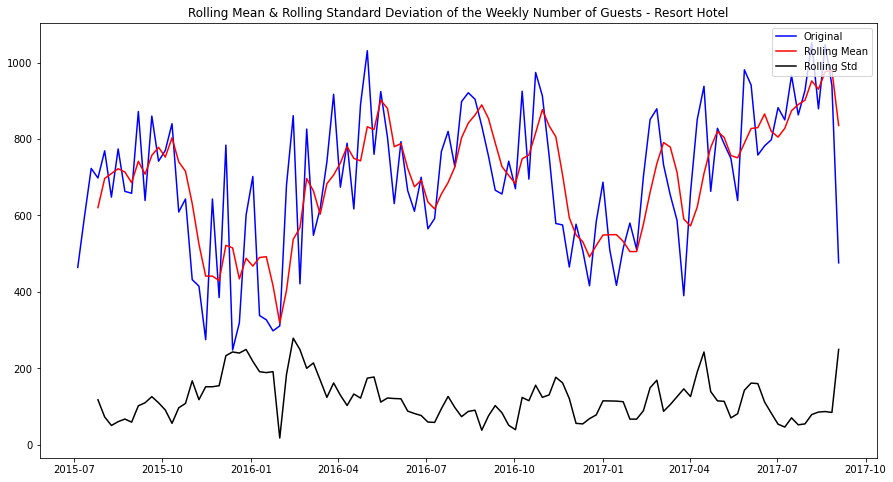

In [82]:
# Rolling Mean & Rolling Standard Deviation of Resort Hotel
plt.figure(figsize=(15, 8))
rolling_mean = Number_guests_resort_weekly.rolling(window=4).mean()
rolling_std = Number_guests_resort_weekly.rolling(window=4).std()
plt.plot(Number_guests_resort_weekly, color='blue', label='Original')
plt.plot(rolling_mean, color='red', label='Rolling Mean')
plt.plot(rolling_std, color='black', label='Rolling Std')
plt.legend(loc='upper right')
plt.title('Rolling Mean & Rolling Standard Deviation of the Weekly Number of Guests - Resort Hotel')
plt.show()

In [83]:
trainResort = Number_guests_resort_weekly[:90]
testResort = Number_guests_resort_weekly[90:]

In [84]:
# Fit auto_arima function to NumberOfGuests_ResortWeekly Dataset
stepwise_fit = auto_arima(trainResort['Total Guests'], start_p=1, start_q=1,
                          max_p=3, max_q=3, m=12,
                          start_P=0, seasonal=True,
                          d=None, D=1, trace=True,
                          error_action='ignore',
                          suppress_warnings=True,
                          stepwise=True)

stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1088.883, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1056.045, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1086.993, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1062.816, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1047.351, Time=0.56 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1073.784, Time=0.36 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1040.958, Time=0.65 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1048.759, Time=0.31 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1042.4

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   90
Model:             SARIMAX(2, 0, 0)x(2, 1, 0, 12)   Log Likelihood                -514.573
Date:                            Tue, 20 Jul 2021   AIC                           1039.145
Time:                                    11:49:53   BIC                           1050.929
Sample:                                         0   HQIC                          1043.863
                                             - 90                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3871      0.113      3.419      0.001       0.165       0.609
ar.L2          0.3222      0.104      3.090      0.002       0.118       0.527
ar.S.L12      -0.4871      0.133     -3.674      0.000      -0.747      -0.227
ar.S.L24      -0.4128      0.131     -3.160      0.002      -0.669      -0.157
sigma2      2.945e+04   6699.761      4.395      0.000    1.63e+04    4.26e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.16   Jarque-Bera (JB):                 1.32
Prob(Q):                              0.69   Prob(JB):                         0.52
Heteroskedasticity (H):               0.75   Skew:                            -0.05
Prob(H) (two-sided):                  0.47   Kurtosis:                         2.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [86]:
modelResort = sm.tsa.statespace.SARIMAX(trainResort['Total Guests'],
                    order=(2, 0, 0),
                    seasonal_order=(2, 1, 0, 12))

resultResort = modelResort.fit()

# Prediction of the Test data
predictionsResortTest = resultResort.predict(90, 113, typ='levels').rename("Predictions")


Text(0, 0.5, 'Number of Guests')

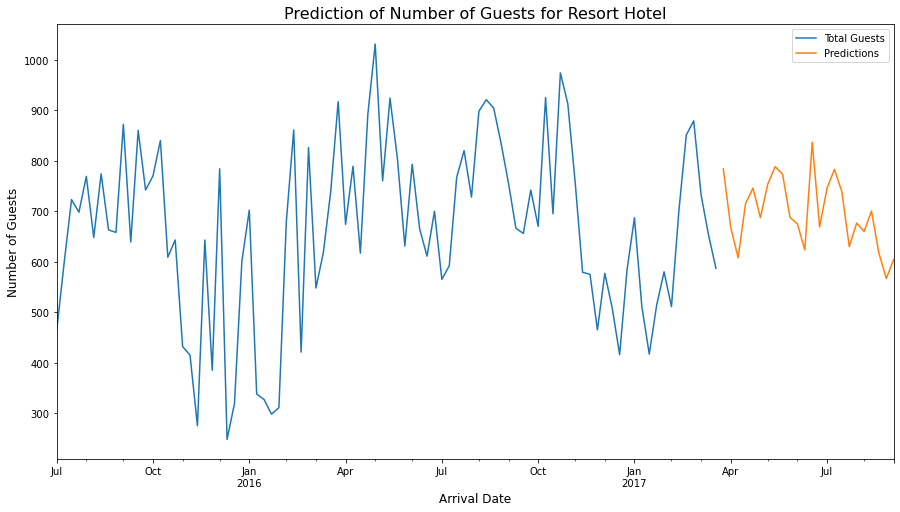

In [97]:
#Prediction of Number of Guests
plt.figure(figsize=(15, 8))
trainResort['Total Guests'].plot(legend=True)
predictionsResortTest.plot(legend=True)
plt.title('Prediction of Number of Guests for Resort Hotel', fontsize=16)
plt.xlabel('Arrival Date', fontsize=12)
plt.ylabel('Number of Guests', fontsize=12)

In [91]:
#平均绝对百分比误差，MAPE
MeanAbsPercentageErrResort_test = mean_absolute_percentage_error(testResort, predictionsResortTest)
print('Test MAPE Resort Hotel: %f' % MeanAbsPercentageErrResort_test)

Test MAPE Resort Hotel: 0.241623
